Overview, Week 5: GANs ---------------------------------------


                                                                          ****** NOTE ******
                                                          ******* SEE BOTTOM OF NOTEBOOK FOR KAGGLE SCORE  ****

Generative Adversarial Networks (GANs)

A GAN consists of two neural networks (at least): a generator model and a discriminator model. The primary task of the generator model is to create images, while the discriminator has the task of accurately classifying the generator model's images as "fake" or "not real". This in turn trains the generator to produce results that "trick" the discriminator. The process of these two models playing "tug-of-war" against one another is foundational for building up a generator model that produces desirable results.

I’m Something of a Painter Myself - Kaggle Project

Actually, I am not. I don't paint often. But a propertly trained GAN can make it seem so. In fact, GANs can produce results that are far beyond my painting capabilities.

Our task for this project is to build a GAN that generates 7,000 to 10,000 Monet-style images. These images can be transformed from the photos directory (real photos) or generated from scratch using other GAN architectures like DCGAN. These final images will be evaluated on MiFID (Memorization-informed Fréchet Inception Distance), which is a modification from Fréchet Inception Distance (FID). The smaller MiFID is, the better the generated images are considered. The final results package will be a zip, images.zip, of images sized 256x256x3 (RGB- jpg format).

EDA ------------------------
The dataset contains four directories: monet_tfrec, photo_tfrec, monet_jpg, and photo_jpg.

The monet directories contain Monet paintings; these are used to train the model.

Additional information about the dataset:
- monet_jpg - 300 Monet paintings sized 256x256 in JPEG format
- monet_tfrec - 300 Monet paintings sized 256x256 in TFRecord format
- photo_jpg - 7028 photos sized 256x256 in JPEG format
- photo_tfrec - 7028 photos sized 256x256 in TFRecord format

In [83]:
#Imports

import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os, sys

#set up working directories
dir_monet = os.path.join('dataset','monet_jpg')
dir_photos = os.path.join('dataset','photo_jpg')
output_images = 'output'

In [84]:
#create a list of images for paintings and photos
monet_paintings = [os.path.join(dir_monet, painting) for painting in os.listdir(dir_monet) if os.path.isfile(os.path.join(dir_monet, painting))]
photos = [os.path.join(dir_photos, photo) for photo in os.listdir(dir_photos) if os.path.isfile(os.path.join(dir_photos, photo))]

#define a standard size for our images
IMAGE_SIZE = [256, 256]

# decoding step is used to prepare the image data for the model
def decode(image_data):
    image = tf.image.decode_jpeg(image_data, channels=3) #converts the raw JPEG byte string to RGB tensor of integers ([0,255] range for each color value)
    image = (tf.cast(image, tf.float32) / 127.5) - 1 #normalizing image data ([0, 255] integer range) to [-1, 1] floating-point range. This gives the model better handling.
    image = tf.reshape(image, [*IMAGE_SIZE, 3]) #resize images to ensure 256x256x3 size, as the generator and discriminator models require a fixed input shape
    return image

# process the image by reading and decoding it
def process(file_path):
    image_data = tf.io.read_file(file_path)
    return decode(image_data)

# create datasets for EDA operations
monet_ds = tf.data.Dataset.from_tensor_slices(monet_paintings)
photo_ds = tf.data.Dataset.from_tensor_slices(photos)
monet_ds = monet_ds.map(process, num_parallel_calls=tf.data.AUTOTUNE)
photo_ds = photo_ds.map(process, num_parallel_calls=tf.data.AUTOTUNE)
#stack individual elements into one large tensor
monet_ds = monet_ds.batch(1)
photo_ds = photo_ds.batch(1)

print("shape of the data in the tensor after pre-processing:")
print(f"monet_ds: {monet_ds.element_spec}")
print(f"photo_ds: {photo_ds.element_spec}")
print("Dinmensions should match")

shape of the data in the tensor after pre-processing:
monet_ds: TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)
photo_ds: TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)
Dinmensions should match


In [85]:
#verify the dataset sizes

num_monet = len(monet_paintings)
num_photos = len(photos)

print(f"Monet Paintings: {num_monet} samples")
print(f"Real Photos: {num_photos} samples")
print(f"Ratio of Photos / Monet: {num_photos / num_monet:.2f}:1")

Monet Paintings: 300 samples
Real Photos: 7038 samples
Ratio of Photos / Monet: 23.46:1


First 5 Monet Paintings in Dataset monet_ds


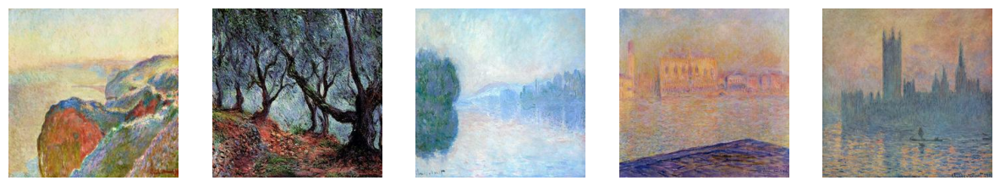

In [86]:
#show first 5 monet images

print("First 5 Monet Paintings in Dataset monet_ds")
plt.figure(figsize=(15, 3))
i = 1
for image in monet_ds.take(5):
    plt.subplot(1, 5, i)
    plt.axis('off')
    display_image = (image.numpy()[0] * 0.5) + 0.5
    plt.imshow(display_image)
    i += 1
plt.show()

First 5 Real Photos in Dataset photo_ds


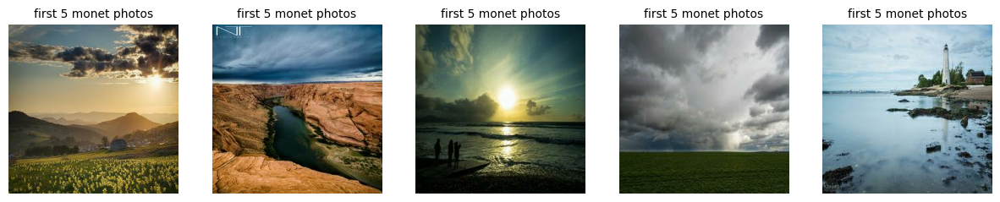

In [87]:
#show first 5 real photos

print("First 5 Real Photos in Dataset photo_ds")
plt.figure(figsize=(15, 3))
i = 1
for image in photo_ds.take(5):
    plt.subplot(1, 5, i)
    plt.title('first 5 monet photos', fontsize=10)
    plt.axis('off')
    display_image = (image.numpy()[0] * 0.5) + 0.5
    plt.imshow(display_image)
    i += 1
plt.show()

In [88]:
#Finally, prepare the datasets for training by shuffling and zipping 

BATCH_SIZE = 2 # can be adjusted depending on GPU

shuffle_count = min(num_monet,num_photos) #set the shuffle count to be the lowest count from our two datasets so that we ensure the smallest collection is completely shuffled

#shuffle
#repeat the dataset. This ensures we have a continuous flow of data while training (so that we do not run out of training samples)
monet_ds_train = monet_ds.unbatch().shuffle(shuffle_count).repeat().batch(BATCH_SIZE)
photo_ds_train = photo_ds.unbatch().shuffle(shuffle_count).repeat().batch(BATCH_SIZE)

#the datasets get zipped together so that they load in parallel, yielding one source image and a target image; one real, one fake- this way the models both recieve information
#the repeat call from earlier ensures that if we pass the image count in one collection, it loops around to the first of that category and continues to pair
train_ds = tf.data.Dataset.zip((monet_ds_train, photo_ds_train))
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)

print(f"Final Dataset Created from monet_ds and photo_ds as 'train_ds'")

Final Dataset Created from monet_ds and photo_ds as 'train_ds'


--- MODEL ARCHITECTURE -----

SOURCES:

tutorial from https://www.geeksforgeeks.org/machine-learning/cycle-generative-adversarial-network-cyclegan-2/

----------------------------------------------------------------------------------------------------
GENERATOR PLAN:

Create two models (G and F) to work harmoniously
- G transforms real-life photos (domain X) to artwork (domain Y)
- F transforms images from domain Y back to domain X.

X is the input and Y is the desired output

DISCRIMINATOR PLAN:

Create two discriminators (D1 and D2) to challenge the generator output (X and Y respectively)
- D1 classifies between real images from domain X and generated images from F (is this a real photo or did F make it from input Y?)
- D2 classifies between artwork images from domain Y and generated images from G (is this a real painting or did G make it from input X?)

Following this tutorial, the architecture will be:
- c7s1-64 → d128 → d256 → R256 (×6 or 9) → u128 → u64 → c7s1-3
----------------------------------------------------------------------------------------------------
GENERATOR ARCHITECTURE:

- Encoder: input image is passed through three convolution layers which extract features and compress the image while increasing the number of channels
- Transformer: The encoded image is processed through 6 or 9 residual blocks which helps retain important image details.
- Decoder: The transformed image is up-sampled using two deconvolution layers and restoring it to its original size

DISCRIMINATOR ARCHITECTURE (CycleGAN uses a PatchGAN instead of regular GAN discriminator):

PatchGAN breaks the image into smaller patches (e.g 70×70 patches) where each value judges if the corresponding patch is real or fake whereas a regular GAN woud look at the entire 256x256 image to do so.

Following the tutorial, the discriminator architecture will be: 
- C64 → C128 → C256 → C512 → Final Convolution


In [89]:
#use links as needed

#!pip install -q git+https://github.com/tensorflow/examples.git
#!pip install tensorflow-addons

In [90]:
# Important Imports and Variables
import warnings
warnings.filterwarnings('ignore') #pesky warnings >:)

import tensorflow as tf
from tensorflow_examples.models.pix2pix import pix2pix #base generator and discriminator
import tensorflow_addons as tfa #for the CycleGAN
import time

# Set the input image size
OUTPUT_CHANNELS = 3
IMG_WIDTH = 256
IMG_HEIGHT = 256
LAMBDA = 10.0
EPOCHS = 10 #running out of time on this project
STEPS_PER_EPOCH = 8

In [91]:
#build the models (Generators and Discriminators)

#Generators --------------------------
#G: Photo(X) to Monet(Y)
monet_generator = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
#F: Monet (Y) to Photo(X)
photo_generator = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

#Discriminators
#Classify between real/fake Monet images
monet_discriminator = pix2pix.discriminator(norm_type='instancenorm', target=False)
#Classify between real/fake photos
photo_discriminator = pix2pix.discriminator(norm_type='instancenorm', target=False)

#build the model so that they can be access during training. The dummy data is temporary

dummy_image = tf.random.normal((1, IMG_HEIGHT, IMG_WIDTH, OUTPUT_CHANNELS))

monet_generator(dummy_image, training=False)
photo_generator(dummy_image, training=False)
monet_discriminator(dummy_image, training=False)
photo_discriminator(dummy_image, training=False)

sys.stdout.flush() #suppress output

In [92]:
# We bring in Adam for an optimizer

generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [93]:
#checkpoint object helps with tracking 

checkpoint_path = "checkpoints"

ckpt = tf.train.Checkpoint(
    monet_generator=monet_generator,       
    photo_generator=photo_generator,
    monet_discriminator=monet_discriminator,
    photo_discriminator=photo_discriminator,
    generator_g_optimizer=generator_g_optimizer,
    generator_f_optimizer=generator_f_optimizer,
    discriminator_x_optimizer=discriminator_x_optimizer,
    discriminator_y_optimizer=discriminator_y_optimizer
)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

#use checkpoints if the run broke and we need to continue
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Using latest checkpoint')
else:
    print ('Not using a checkpoint for the models. Do any checkpoints exist? If not, disregard')

Using latest checkpoint


In [94]:
#stores previously generated fake images to reduce model oscillation
class ImagePool:
    def __init__(self, pool_size=50):
        self.pool_size = pool_size
        self.images = []
    
    def query(self, images):
        if self.pool_size == 0:
            return images
        
        return images

fake_monet_pool = ImagePool(pool_size=50)
fake_photo_pool = ImagePool(pool_size=50)

print("pools created for discriminator training")

pools created for discriminator training


In [95]:
#define loss functions so that we can validate our improvements/setbacks

def discriminator_loss(real, generated):
    real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(
        tf.ones_like(real), real)
    generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(
        tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5

def generator_loss(generated):
    return tf.keras.losses.BinaryCrossentropy(from_logits=True)(
        tf.ones_like(generated), generated)

def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss1

def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

In [96]:
@tf.function

# training step for the CycleGAN model, updating all four models based on the combined loss functions
def train_step(real_monet, real_photo):

    # Use persistent=True to calculate gradients multiple times (once for generators, once for discriminators)
    with tf.GradientTape(persistent=True) as tape:
        
        #Generator Forward Passes ----------------------------
        #Photo(X) to Fake Monet(Y)
        fake_monet = monet_generator(real_photo, training=True)
        #Monet(Y) to Fake Photo(X)
        fake_photo = photo_generator(real_monet, training=True)

        #Reconstruction --------------------- CycleGAN
        #Photo -> Monet -> Photo
        cycled_photo = photo_generator(fake_monet, training=True)
        #Monet -> Photo -> Monet
        cycled_monet = monet_generator(fake_photo, training=True)

        same_monet = monet_generator(real_monet, training=True)
        same_photo = photo_generator(real_photo, training=True)

        #Discriminator Predictions (Real vs. Fake) ---------------------------------------------------
        #Feeds real images and fake images to the discriminators
        disc_real_monet = monet_discriminator(real_monet, training=True)
        disc_fake_monet = monet_discriminator(fake_monet_pool.query(fake_monet), training=True)
        
        disc_real_photo = photo_discriminator(real_photo, training=True)
        disc_fake_photo = photo_discriminator(fake_photo_pool.query(fake_photo), training=True)

        #Calculating Losses
        #Generators trying to fool Discriminators
        monet_gen_gan_loss = generator_loss(disc_fake_monet)
        photo_gen_gan_loss = generator_loss(disc_fake_photo)
        total_gen_gan_loss = monet_gen_gan_loss + photo_gen_gan_loss
        #note, this is what we will use to re-draw the decision boundary

        #Reconstruction Loss
        total_cycle_loss = calc_cycle_loss(real_monet, cycled_monet) + calc_cycle_loss(real_photo, cycled_photo)
        #Identity Loss (Color Preservation)
        total_identity_loss = identity_loss(real_monet, same_monet) + identity_loss(real_photo, same_photo)
        #Total Generator Loss (G_monet/G_photo optimized together)
        total_generator_loss = total_gen_gan_loss + total_cycle_loss + total_identity_loss
        # Total Discriminator Loss (D_monet/D_photo optimized separately)
        monet_disc_loss = discriminator_loss(disc_real_monet, disc_fake_monet)
        photo_disc_loss = discriminator_loss(disc_real_photo, disc_fake_photo)

    #Gradient Calculation -------------------------------------------------
    #combined generator loss
    monet_generator_gradients = tape.gradient(total_generator_loss, monet_generator.trainable_variables)
    photo_generator_gradients = tape.gradient(total_generator_loss, photo_generator.trainable_variables)
    
    #Discriminator losses
    monet_discriminator_gradients = tape.gradient(monet_disc_loss, monet_discriminator.trainable_variables)
    photo_discriminator_gradients = tape.gradient(photo_disc_loss, photo_discriminator.trainable_variables)
    
    #Update Weights -----------------------------------------------
    generator_g_optimizer.apply_gradients(zip(monet_generator_gradients, monet_generator.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(photo_generator_gradients, photo_generator.trainable_variables))
    
    discriminator_y_optimizer.apply_gradients(zip(monet_discriminator_gradients, monet_discriminator.trainable_variables))
    discriminator_x_optimizer.apply_gradients(zip(photo_discriminator_gradients, photo_discriminator.trainable_variables))
    
    return {
        'total_gen_loss': total_generator_loss,
        'monet_disc_loss': monet_disc_loss,
        'photo_disc_loss': photo_disc_loss
    }

In [97]:
#operation of the generator

def generate(model, test_input): #take a photo and make a monet painting
    prediction = model(test_input, training=False)[0].numpy()
    
    #scale the image back to [0, 1] for plotting
    prediction = (prediction * 0.5) + 0.5 
    
    plt.figure(figsize=(12, 12))
    display_list = [test_input[0].numpy(), prediction]
    title = ['Input', 'Generated']

    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        if i == 0: plt.imshow((display_list[i] * 0.5) + 0.5)
        else: plt.imshow(display_list[i])
        plt.axis('off')
    plt.show()

# Get a single example photo for testing the generator during training
for photo in photo_ds.take(1):
    example_photo = photo
    break

In [98]:
#lists to store losses for plotting later
gen_losses = []
monet_disc_losses = []
photo_disc_losses = []

# Our training function
def fit(train_dataset, epochs, steps_per_epoch):
    
    train_data = iter(train_dataset) # stepwise access to the dataset pairs

    for epoch in range(epochs):
        start = time.time()

        epoch_gen_loss = 0
        epoch_monet_loss = 0
        epoch_photo_loss = 0
        
        print(f"\nEpoch {epoch+1}")
        
        # steps per epoch
        for step in range(steps_per_epoch):
            #batch fetching (real_monet, real_photo) from the iterator
            real_monet, real_photo = next(train_data) 
            
            # The core CycleGAN training logic
            losses = train_step(real_monet, real_photo)

            #losses for this epoch
            epoch_gen_loss += losses['total_gen_loss'].numpy()
            epoch_monet_loss += losses['monet_disc_loss'].numpy()
            epoch_photo_loss += losses['photo_disc_loss'].numpy()
            
            if (step + 1) % 1000 == 0:
                print(f"  Step {step+1:4d}/{steps_per_epoch}: Gen Loss = {losses['total_gen_loss'].numpy():.4f}, Disc Loss = {losses['monet_disc_loss'].numpy() + losses['photo_disc_loss'].numpy():.4f}")

        #avg losses for the epoch
        epoch_gen_loss /= steps_per_epoch
        epoch_monet_loss /= steps_per_epoch
        epoch_photo_loss /= steps_per_epoch

        #store for plotting
        gen_losses.append(epoch_gen_loss)
        monet_disc_losses.append(epoch_monet_loss)
        photo_disc_losses.append(epoch_photo_loss)
        
        # ** Generate and then display a sample image
        print("\nGenerating sample image...")
        generate(monet_generator, example_photo)
        
        # ** Save the model checkpoint
        if (epoch + 1) % 5 == 0:
            ckpt_save_path = ckpt_manager.save()
            print(f"Saving checkpoint for epoch {epoch+1} at {ckpt_save_path}")

        print(f"Time taken for epoch {epoch+1} is {time.time() - start:.2f} sec\n")


Epoch 1

Generating sample image...


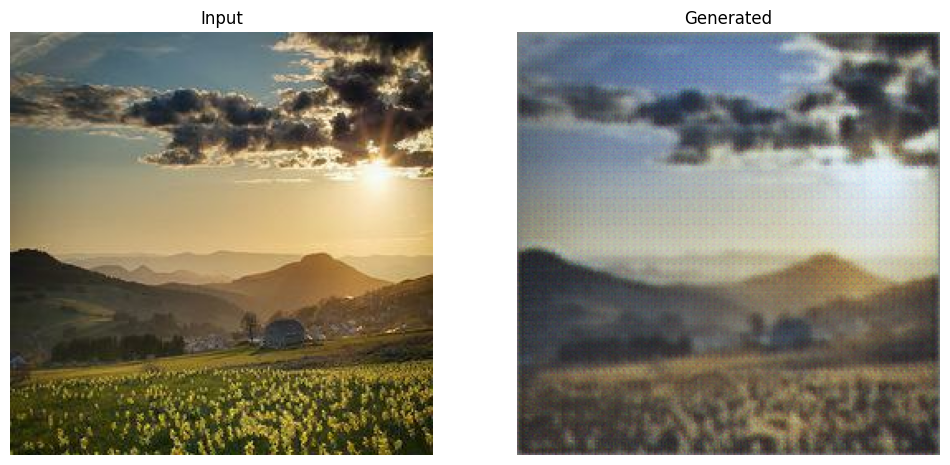

Time taken for epoch 1 is 39.93 sec


Epoch 2

Generating sample image...


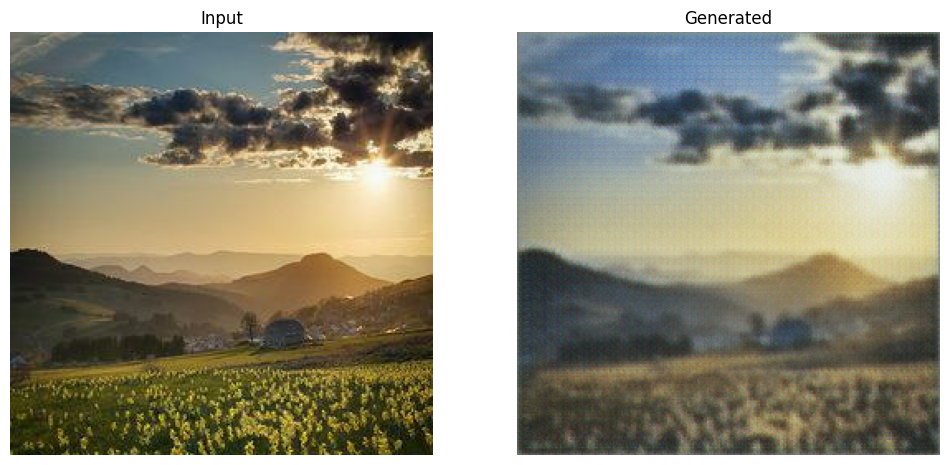

Time taken for epoch 2 is 8.63 sec


Epoch 3

Generating sample image...


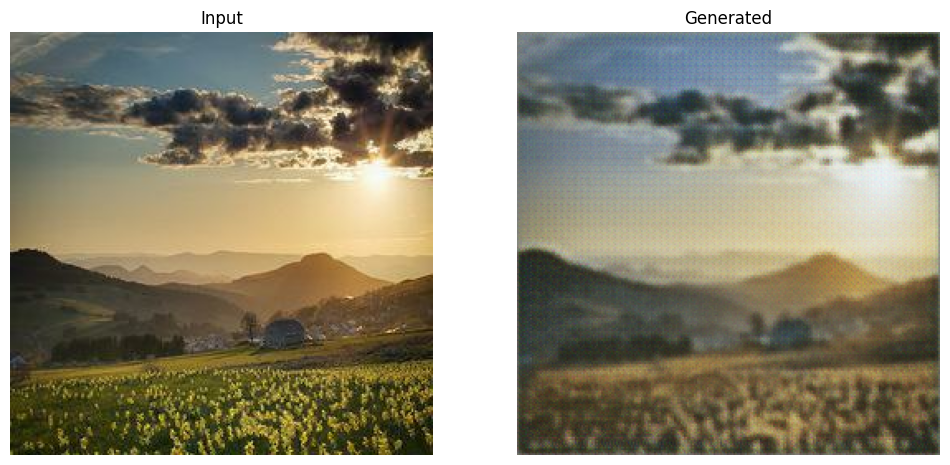

Time taken for epoch 3 is 8.58 sec


Epoch 4

Generating sample image...


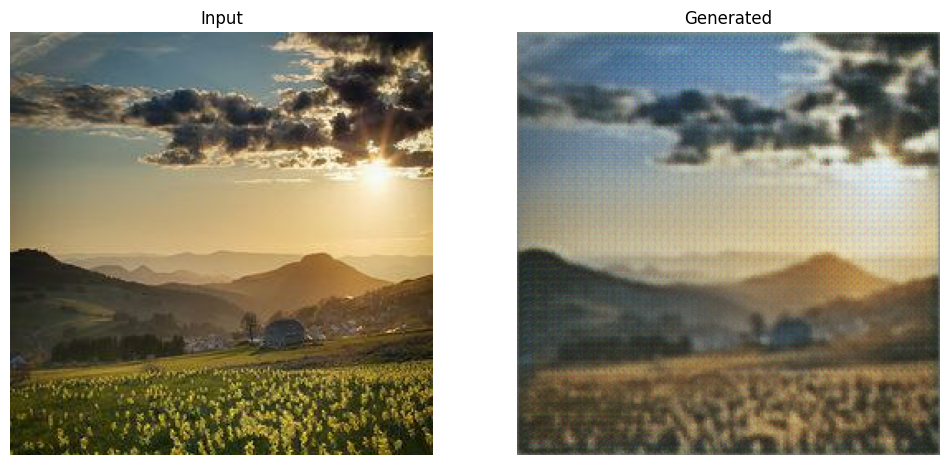

Time taken for epoch 4 is 8.64 sec


Epoch 5

Generating sample image...


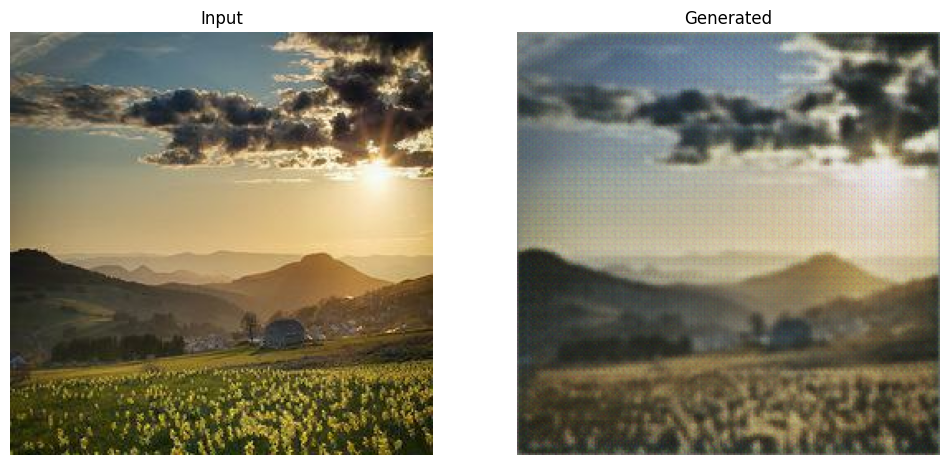

Saving checkpoint for epoch 5 at checkpoints\ckpt-2
Time taken for epoch 5 is 27.61 sec


Epoch 6

Generating sample image...


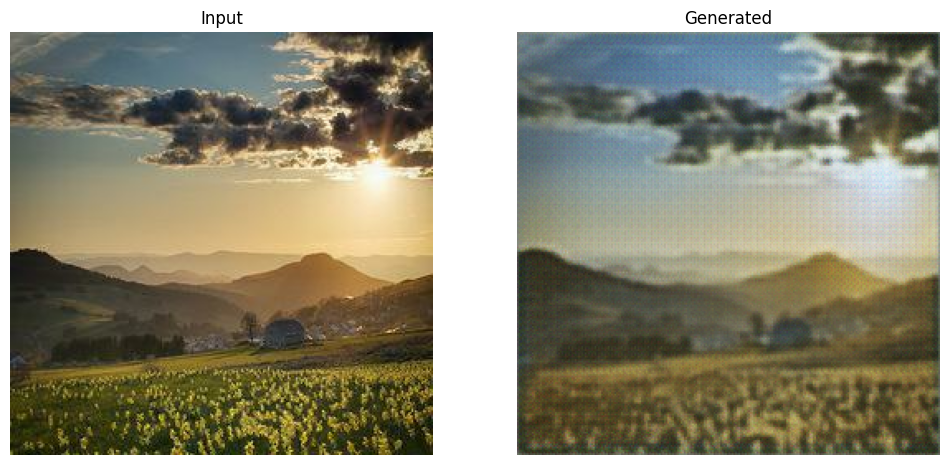

Time taken for epoch 6 is 8.76 sec


Epoch 7

Generating sample image...


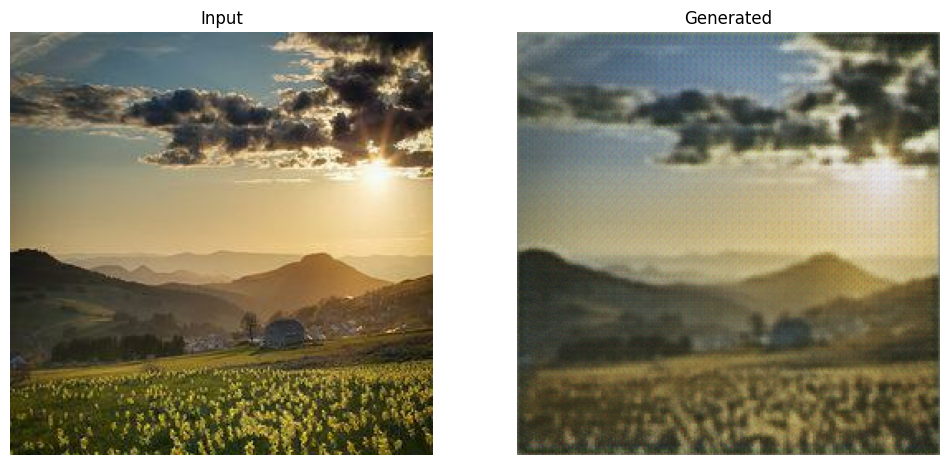

Time taken for epoch 7 is 8.57 sec


Epoch 8

Generating sample image...


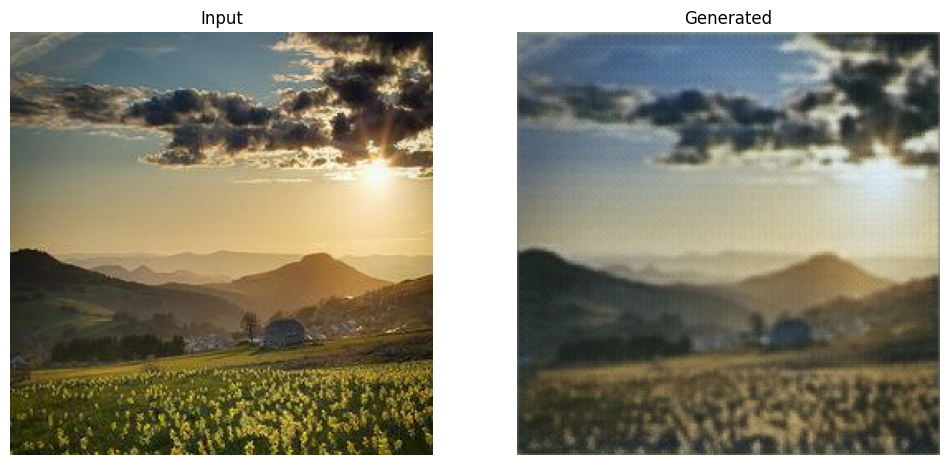

Time taken for epoch 8 is 8.58 sec


Epoch 9

Generating sample image...


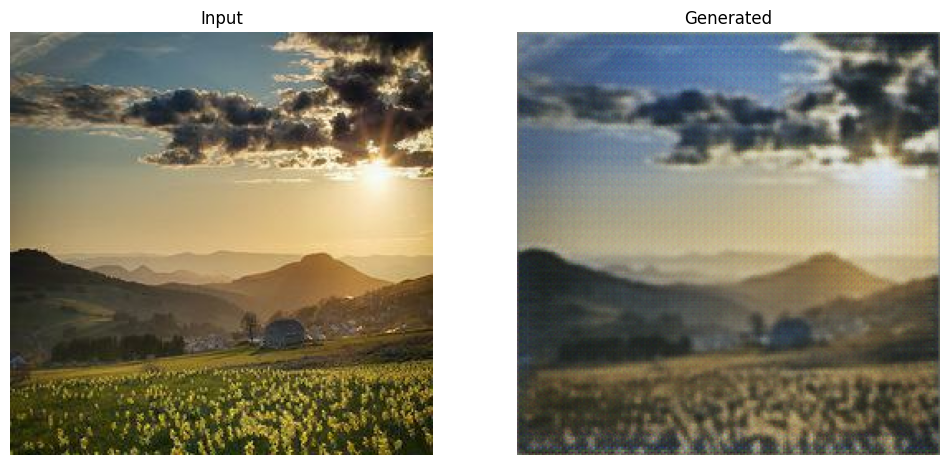

Time taken for epoch 9 is 8.58 sec


Epoch 10

Generating sample image...


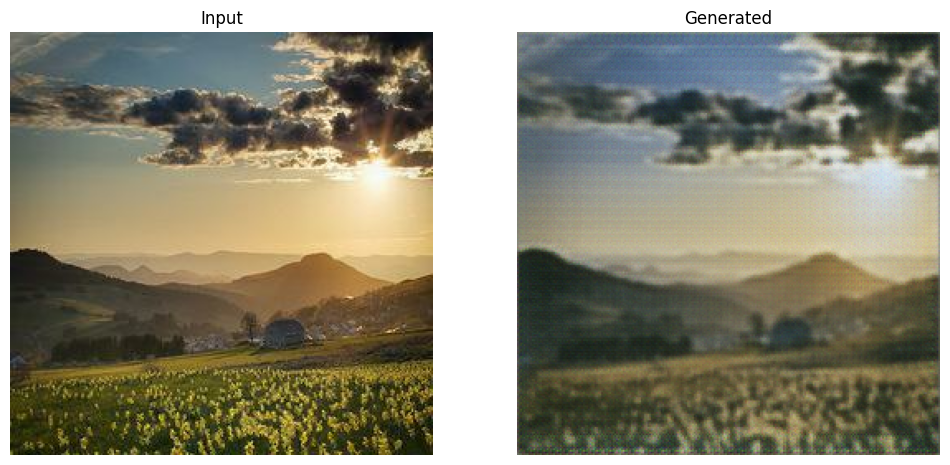

Saving checkpoint for epoch 10 at checkpoints\ckpt-3
Time taken for epoch 10 is 27.59 sec



In [99]:
#RUN
fit(train_ds, EPOCHS, STEPS_PER_EPOCH)

-- ANALYSIS, DISCUSSION, CONCLUSION ----

In [100]:
#plotting for analysis

def plot_losses():
    plt.figure(figsize=(15, 5))
    
    #Generator Loss
    plt.subplot(1, 3, 1)
    plt.plot(gen_losses, label='Generator Loss', linewidth=2)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Generator Loss Over Time')
    plt.legend()
    plt.grid(True)
    
    #Monet Discriminator Loss
    plt.subplot(1, 3, 2)
    plt.plot(monet_disc_losses, label='Monet Discriminator Loss', linewidth=2, color='orange')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Monet Discriminator Loss Over Time')
    plt.legend()
    plt.grid(True)
    
    #Photo Discriminator Loss
    plt.subplot(1, 3, 3)
    plt.plot(photo_disc_losses, label='Photo Discriminator Loss', linewidth=2, color='green')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Photo Discriminator Loss Over Time')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig('training_losses.png', dpi=300)
    plt.show()
    print("Loss graph saved as 'training_losses.png' in the project directory")

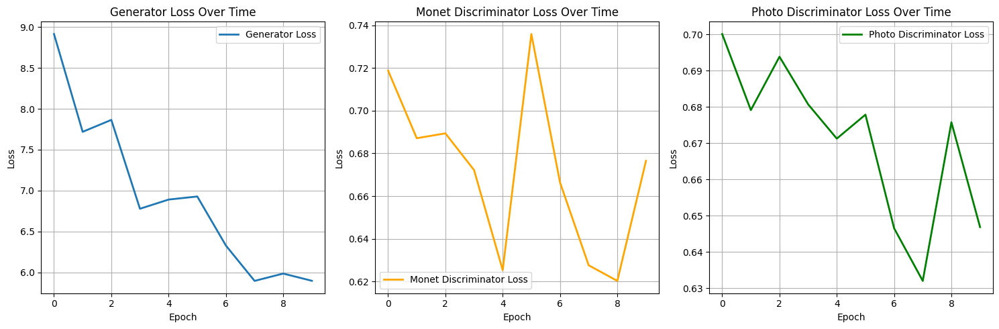

Loss graph saved as 'training_losses.png' in the project directory


In [102]:
#run and load the plot
plot_losses()

From the training loss data we can see that the CycleGAN architecture's re-definition of the boundary between real and fake led by both the Monet and Photo Discriminators has driven an improving Generation model. As the Epochs increase, the Generator develops patterns that attempt to fool the Descriminator- these developments are correlated with a shrinking loss value.
- the loss starts near 9 for the pre-trained generator
- by epoch 9 the loss has dropped to just below 6
- the the trend follows an exponential decrease for the first 10 epochs

Due to time and GPU constrains, I will not be running more that 10 Epochs. However, there is a clear pattern- with more training time the Generator will improve it's capabilities; mimicing the Monet painting style shown in the original database. 

From the training session above we see the real-painting generation pairs for each epoch. With each run, the generated image is noticably approaching an artistic, almost "blurred", representation of the real image. This representation of the image is what the model has been encouraged to generate to avoid detection from the Discriminator- logically approaching a pattern that the Monet paintings share. What this pattern is exactly- is difficult for a human to interpret- but the model picks up subtle nuances from the input tensors, storing them as weights that drive the reconstruction. 

In [ ]:
#final code for Kaggle Submission

import os
import zipfile
import numpy as np
from PIL import Image
import tensorflow as tf

NUM_IMAGES = 7500  #between 7000-10000 as needed

#output directory
output_dir = "../tmp"
os.makedirs(output_dir, exist_ok=True)

zip_path = os.path.join(output_dir, "images.zip")

with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
    
    photo_dataset = photo_ds.unbatch().batch(1).repeat()
    photo_iterator = iter(photo_dataset)
    
    for i in range(NUM_IMAGES):
        batch = next(photo_iterator)

        fake_monet = monet_generator(batch, training=False)
        fake_monet_np = fake_monet[0].numpy()
        fake_monet_np = ((fake_monet_np * 0.5) + 0.5) * 255
        fake_monet_np = fake_monet_np.astype(np.uint8)
        img = Image.fromarray(fake_monet_np)
        img_filename = f"monet_{i:05d}.jpg"
        
        import io
        img_bytes = io.BytesIO()
        img.save(img_bytes, format='JPEG', quality=95)
        img_bytes.seek(0)
        zipf.writestr(img_filename, img_bytes.getvalue())
        
        if (i + 1) % 1000 == 0: #progress
            print(f"  Generated {i + 1}/{NUM_IMAGES} images")

print(f"\ngenerated {NUM_IMAGES} images")
print(f"file created: {zip_path}")

The resulting Kaggle score for a 10 epoch run:

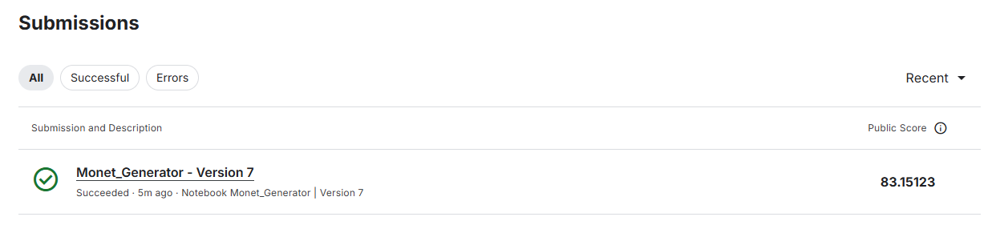